In [19]:
pwd

'/Users/mohammedkhattab/Downloads/PhD_scProject/scgast_Project'

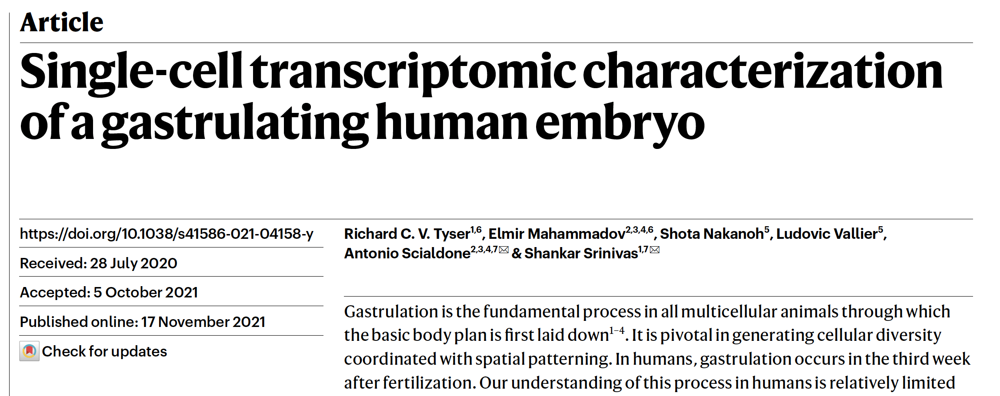

In [13]:
from IPython.display import Image, display
display(Image(filename='Science.png'))

[__Tyser's et al. (2021)__](https://doi.org/10.1038/s41586-021-04158-y)

## Introduction
#### - In this notebook we will re-visit the data from the paper titled [ Single-cell transcriptomic characterization of a gastrulating human embryo ](https://doi.org/10.1038/s41586-021-04158-y) Tyser et al. (2021), where we will explore the data of the 1195 single cell from embryonic stage Carnegie Stage 7 (CS7) around the third week after fertilization, explore the present cell types and plot them in UMAP plots (Uniform Manifold Approximation and Projection), eventually, we will use the R package [infercnv](https://github.com/broadinstitute/infercnv) to identify any type of copy number variations in comparison to the most basal cell type in the sample which is the __Epiblast__, and see how single cell data can tell us about it.

### Chapter 1: Packages import and data upload

In [14]:
import numpy as np
import pandas as pd
import anndata as ad
import pyreadr

In [15]:
import scanpy as sc
import urllib.request
from pathlib import Path
import os

In [ ]:
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix
import scarches as sca
import scanorama
from scipy.io import mmwrite

In [ ]:
import anndata2ri
from rpy2.robjects import conversion
from rpy2.robjects.conversion import localconverter

In [ ]:
with localconverter(anndata2ri.converter):
    %reload_ext rpy2.ipython

sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor="white")

### R libraries for later

In [ ]:
%%R
library(reticulate)
library(Seurat)
library(tidyverse)
library(R.utils) 
library(devtools)
library(tidyverse)
library(Matrix)
library(infercnv)

#### - The expression matrix file `raw_read.rds` and, the UMAP data table containing the cell names `umap.rds` files, that can be found in the paper's github page. Download them through this [link](https://github.com/ScialdoneLab/human-gastrula-shiny) if not already present in your directory.

In [ ]:
# Load .rds file provided by the authors that contains the expression values
raw_reads = pyreadr.read_r("raw_reads.rds")
print(raw_reads.keys())

In [ ]:
# Extract the expression values from the .rds object
raw_reads = raw_reads[None]
print(raw_reads.shape) #(1195, 57490)
raw_reads.head(2) 

### UMAP file upload
#### - __`raw_reads`__ lacks the cell names, luckily they are provided in another object by the authors called __`umap`__, this dataframe contains some useful data, but most importantly it contains the same order of cell names as the __`raw_reads`__ object, enabling the export of the cell names to the counts object.

In [7]:
# Load .rds file 'umap'
umap = pyreadr.read_r("umap.rds")
# Inspect keys
print(umap.keys()) # odict_keys([None])
umap = umap[None]
print(umap.shape) # (1195, 6)

odict_keys([None])
(1195, 6)


In [8]:
#make cell names the index for the `umap`object
umap = umap.set_index("cell_name")
umap.head(2)

,X,X0,X1,cluster_id,sub_cluster
cell_name,,,,,
SS.sc7785290,0,12.213498,-0.550328,Hemogenic Endothelial Progenitors,Blood Progenitors
SS.sc7786612,1,2.404149,-7.389468,Endoderm,DE(P)


In [ ]:
#Now we can add the cell names to the raw_reads object using set_index() function
raw_reads_indexed = raw_reads.set_index(umap.index)
#raw_reads_indexed

In [ ]:
umap.index == raw_reads_indexed.index

### Metadata upload
#### This 'metadata' file `E-MTAB-9388.sdrf.txt` is another file contains some important biological data, can be downloaded from [here](https://www.ebi.ac.uk/biostudies/ArrayExpress/studies/E-MTAB-9388?query=%20E-MTAB-9388) to continue the analysis if the file not already present.
##### Note: The file `E-MTAB-9388.idf.txt` found in the same link above is not necessary for this analysis.

In [15]:
# metadata upload
metadata = pd.read_csv("E-MTAB-9388.zip", sep= "\t")
print(metadata.shape) #After investigating the dataframe, it seems that each cell is repeated once.

(2390, 41)


In [16]:
#We will remove the duplicates using drop_duplicates() function
metadata_clear = metadata.drop_duplicates(subset="Source Name")

In [17]:
#In order to unify the cell names we will change "_" to "." to match the `umap` dataframe we uploaded eariler
metadata_clear.loc[:, "Source Name"] = metadata_clear["Source Name"].str.replace("_", ".", regex=False)

In [18]:
#Make it an Index
metadata_clear = metadata_clear.set_index("Source Name")
# Reindex the umap DataFrame to match the metadata_clear index
umap = umap.reindex(metadata_clear.index)
# Add the annotation column `cluster_id`for later
metadata_clear["cluster_id"] = umap["cluster_id"]

## Chapter 2: Create AnnData Object

In [19]:
# Build AnnData object
adata = ad.AnnData(
    X= raw_reads_indexed.values,          # expression matrix
    obs= metadata_clear,                  # cell metadata
    var= pd.DataFrame(index=raw_reads_indexed.columns)  # gene metadata
)

In [20]:
print(adata)   # should print: AnnData object with n_obs × n_vars = 1195 × 57490

AnnData object with n_obs × n_vars = 1195 × 57490
    obs: 'Comment[ENA_SAMPLE]', 'Comment[BioSD_SAMPLE]', 'Characteristics[organism]', 'Characteristics[developmental stage]', 'Characteristics[age]', 'Unit[time unit]', 'Characteristics[individual]', 'Characteristics[sex]', 'Characteristics[organism part]', 'Characteristics[sampling site]', 'Characteristics[inferred cell type - authors labels]', 'Characteristics[inferred cell type - ontology labels]', 'Material Type', 'Protocol REF', 'Protocol REF.1', 'Protocol REF.2', 'Extract Name', 'Comment[LIBRARY_LAYOUT]', 'Comment[LIBRARY_SELECTION]', 'Comment[LIBRARY_SOURCE]', 'Comment[LIBRARY_STRATEGY]', 'Comment[NOMINAL_LENGTH]', 'Comment[NOMINAL_SDEV]', 'Comment[end bias]', 'Comment[input molecule]', 'Comment[library construction]', 'Comment[primer]', 'Comment[single cell isolation]', 'Comment[spike in]', 'Protocol REF.3', 'Performer', 'Assay Name', 'Technology Type', 'Comment[ENA_EXPERIMENT]', 'Scan Name', 'Comment[SUBMITTED_FILE_NAME]', 'Com

AnnData object with n_obs × n_vars = 1195 × 57490
    obs: 'Comment[ENA_SAMPLE]', 'Comment[BioSD_SAMPLE]', 'Characteristics[organism]', 'Characteristics[developmental stage]', 'Characteristics[age]', 'Unit[time unit]', 'Characteristics[individual]', 'Characteristics[sex]', 'Characteristics[organism part]', 'Characteristics[sampling site]', 'Characteristics[inferred cell type - authors labels]', 'Characteristics[inferred cell type - ontology labels]', 'Material Type', 'Protocol REF', 'Protocol REF.1', 'Protocol REF.2', 'Extract Name', 'Comment[LIBRARY_LAYOUT]', 'Comment[LIBRARY_SELECTION]', 'Comment[LIBRARY_SOURCE]', 'Comment[LIBRARY_STRATEGY]', 'Comment[NOMINAL_LENGTH]', 'Comment[NOMINAL_SDEV]', 'Comment[end bias]', 'Comment[input molecule]', 'Comment[library construction]', 'Comment[primer]', 'Comment[single cell isolation]', 'Comment[spike in]', 'Protocol REF.3', 'Performer', 'Assay Name', 'Technology Type', 'Comment[ENA_EXPERIMENT]', 'Scan Name', 'Comment[SUBMITTED_FILE_NAME]', 'Comment[ENA_RUN]', 'Comment[FASTQ_URI]', 'Factor Value[single cell identifier]', 'Factor Value[inferred cell type - ontology labels]', 'cluster_id'

In [22]:
# Start the standard workflow for Anndata objects
adata.var_names_make_unique()
sc.pp.calculate_qc_metrics(adata, inplace=True)

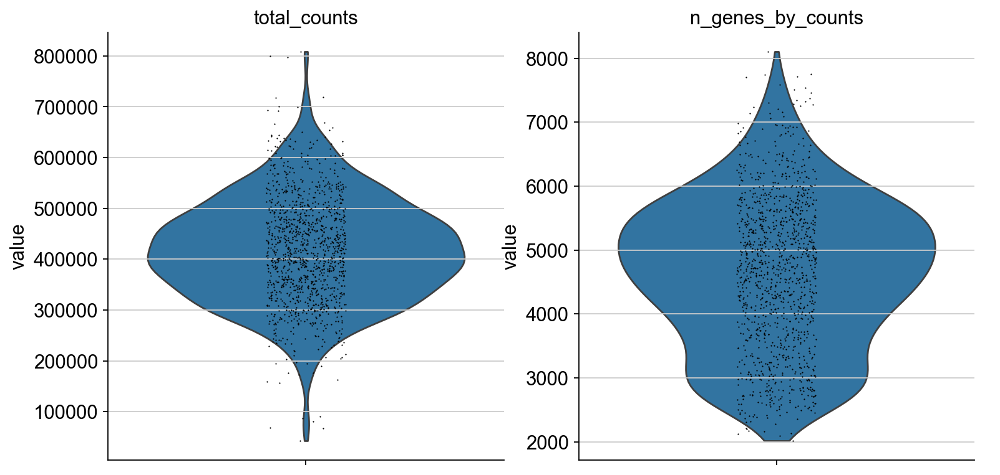

In [23]:
#Check the distribution of counts across cells
sc.pl.violin(adata,['total_counts', 'n_genes_by_counts'], multi_panel= True)

#### The violin plot tell us that our cell population doesn't require further cutting, since the cells are well distributed, no outliers and to maintain as much cells as possible for the further analysis.

In [24]:
# Normalizing to median total counts
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


normalizing counts per cell
    finished (0:00:00)


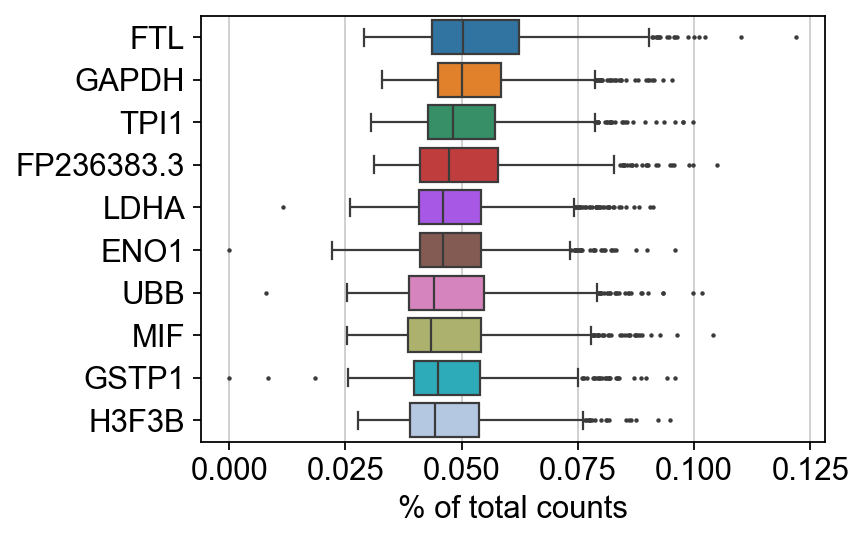

In [25]:
sc.pl.highest_expr_genes(adata, n_top = 10, )

In [ ]:
# Perform the standard scaling and dimentionality reduction workflow
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, n_comps=30, random_state=42)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30, random_state=42)
sc.tl.umap(adata, random_state=42)

In [ ]:
# Annotate highly variable genes in the `adata`object
sc.pp.highly_variable_genes(adata)
sc.pl.highly_variable_genes(adata)

In [ ]:
#Perform leiden clustering with resolution = 0.75
sc.tl.leiden(adata, resolution=0.75, flavor="igraph", n_iterations=2, random_state=42)

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5), dpi=120)

sc.pl.umap(adata, color="leiden", ax=axs[0], show=False)
sc.pl.umap(adata, color="pct_counts_in_top_50_genes", ax=axs[1], show=False)
plt.show()

In [430]:
adata.obs

,Comment[ENA_SAMPLE],Comment[BioSD_SAMPLE],Characteristics[organism],Characteristics[developmental stage],Characteristics[age],Unit[time unit],Characteristics[individual],Characteristics[sex],Characteristics[organism part],Characteristics[sampling site],...,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,leiden,AnnotatedCluster
Source Name,,,,,,,,,,,,,,,,,,,,,
SS.sc7785278,ERS5181934,SAMEA7423586,Homo sapiens,embryo,16 to 19,day,CS7,male,whole organism,yolk sac,...,4922,8.501673,377151.968991,12.840406,23.622851,30.429528,39.508748,55.256619,0,HEP
SS.sc7785279,ERS5181935,SAMEA7423587,Homo sapiens,embryo,16 to 19,day,CS7,male,whole organism,yolk sac,...,6942,8.845489,259888.990001,12.468014,18.311227,25.105456,33.482184,48.358286,1,Primative Streak
SS.sc7785280,ERS5181936,SAMEA7423588,Homo sapiens,embryo,16 to 19,day,CS7,male,whole organism,yolk sac,...,6140,8.722743,437911.014986,12.989773,16.438116,23.168028,31.973973,48.713081,2,Emergent Mesoderm
SS.sc7785281,ERS5181937,SAMEA7423589,Homo sapiens,embryo,16 to 19,day,CS7,male,whole organism,yolk sac,...,3800,8.243019,322351.983054,12.683402,18.344805,27.028758,38.095824,57.775552,3,Nascent Mesoderm
SS.sc7785282,ERS5181938,SAMEA7423590,Homo sapiens,embryo,16 to 19,day,CS7,male,whole organism,yolk sac,...,2964,7.994632,394318.996000,12.884918,25.350752,33.529113,43.988398,62.262868,4,Extra-embryonic Mesoderm
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS.sc7788385,ERS5183125,SAMEA7424905,Homo sapiens,embryo,16 to 19,day,CS7,male,whole organism,caudal,...,6361,8.758098,226569.027995,12.330809,17.380574,24.134041,32.566881,48.247448,7,Advanced Mesoderm
SS.sc7788387,ERS5183126,SAMEA7424906,Homo sapiens,embryo,16 to 19,day,CS7,male,whole organism,caudal,...,4647,8.444192,353921.980998,12.776835,17.275106,24.978208,35.842762,54.734178,3,Nascent Mesoderm
SS.sc7788388,ERS5183127,SAMEA7424907,Homo sapiens,embryo,16 to 19,day,CS7,male,whole organism,caudal,...,2822,7.945555,366998.009999,12.813114,19.084758,28.550866,41.422998,63.511382,3,Nascent Mesoderm


## Chapter 3: Cell type annotation

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:02)


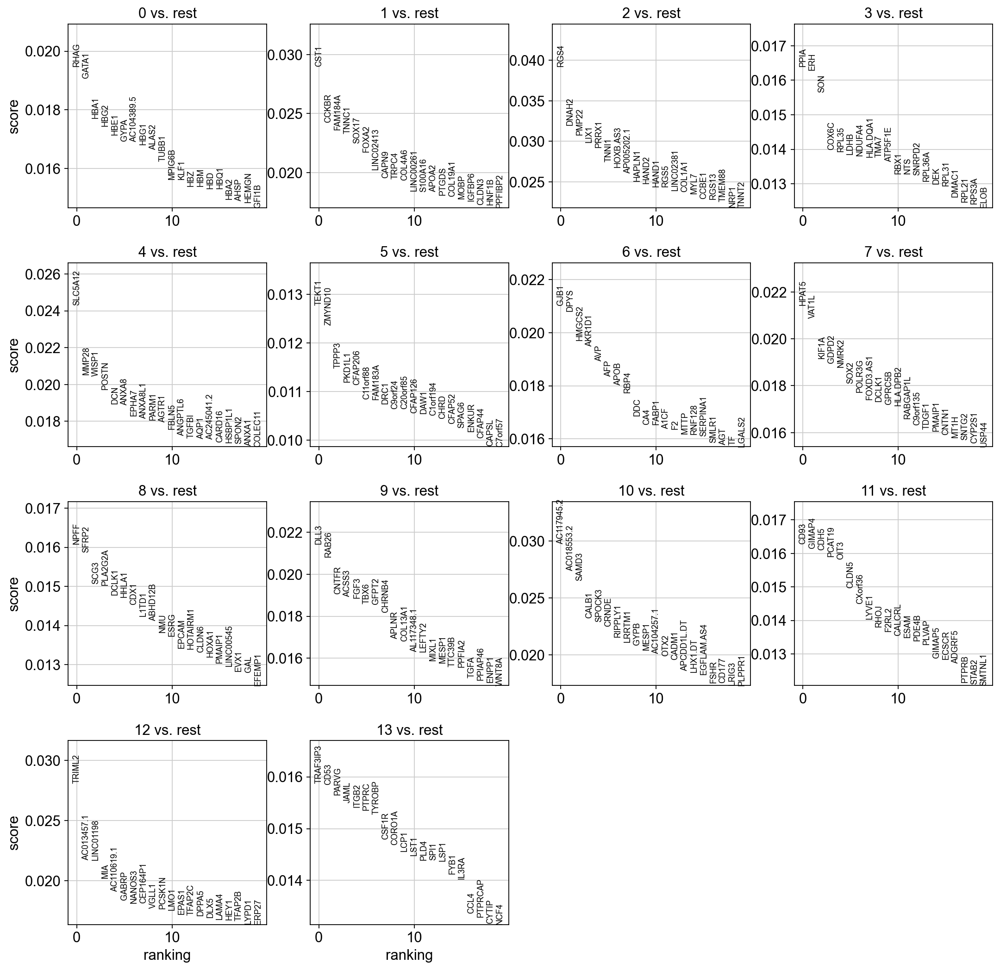

In [368]:
# Find marker genes for each of leiden cluster 
sc.tl.rank_genes_groups(adata, 'leiden', method='logreg')
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

#### The following kernel contains a handful of common markers from Supplementary Note 1 - Annotation of gastrula cell types.

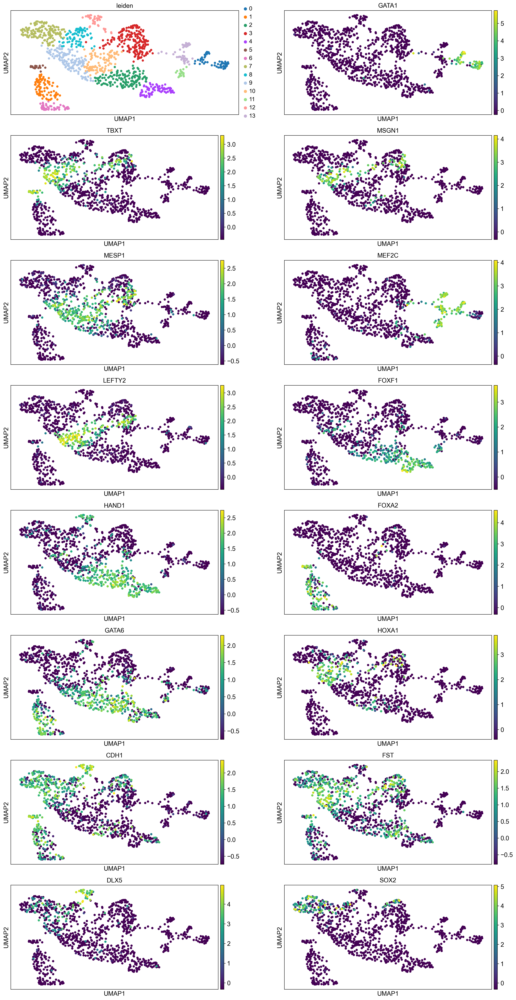

In [369]:
markers = ["leiden", "GATA1", "TBXT", "MSGN1", "MESP1", "MEF2C", 
           "LEFTY2", "FOXF1", "HAND1", "FOXA2", "GATA6", "HOXA1", 
           "CDH1", "FST", "DLX5", "SOX2"]

# Create subplots
fig, axs = plt.subplots(8, 2, figsize=(20, 40), dpi=120)

for i, marker in enumerate(markers):
    row = i // 2
    col = i % 2
    sc.pl.umap(adata, color=marker, ax=axs[row, col], show=False)

plt.show()

### Dotplot for the top markers

In [370]:
# Extract ranked marker genes
marker_df = sc.get.rank_genes_groups_df(adata, group=None)

In [ ]:
top_markers = marker_df.groupby("group", observed=False).head() 

sc.pl.dotplot(
    adata,
    var_names=top_markers['names'].unique().tolist(),
    groupby="leiden",
    standard_scale="var",
    dendrogram=True
)

### Identifying main markers in each cluster, thus representing its cell type.

In [ ]:
marker_genes = {
    'HEP': ['SPI1', 'MEF2C'],
    'Primative Streak': ['TBXT', 'CDH1' , 'FST'],
    'Emergent Mesoderm': ['MESP1', 'LHX1', 'LEFTY2'],
    'Nascent Mesoderm': ['TBXT', 'MESP1', 'MSGN1'],
    'Extra-embryonic Mesoderm': ['FOXF1', 'HAND1'],
    'Axial Mesoderm': ['TBXT', 'FOXA2', 'CDH1'],
    'Erythrocytes': ['GATA1', 'HBZ', 'HBE1'],
    'Advanced Mesoderm': ['MESP1', 'PDGFRA','BMP4', 'SNAI2', "HAND1", "GATA6"],
    'Endoderm': ['SOX17', 'FOXA2', 'CXCR4', 'TMA7'],
    'Epiblast' : ['SOX2', 'OTX2', 'CDH1'],
    'Ectoderm (Amniotic/Embryonic)' : ['DLX5', 'TFAP2A', 'GATA3'],
    'Caudal Ad. M  and PS / N. M': "HOXA1"
}

sc.pl.dotplot(
    adata,
    marker_genes,
    groupby="leiden",
    standard_scale="var",
    dendrogram=True
)

#### The heatmap above is a little messy but this is should be expected, as lots of cells share multiple important markers, but you ultimately each cell type will end up with its unique set of markers.

In [353]:
# Create a mapping dictionary for cell types
cluster2celltype = {
    "0" :'HEP',
    "1" :'Primative Streak',
    "2" :'Emergent Mesoderm',
    "3" :'Nascent Mesoderm',
    "4" :'Extra-embryonic Mesoderm',
    "5" :'Axial Mesoderm',
    "6" :'Erythrocytes',
    "7" :'Advanced Mesoderm',
    "8" :'Endoderm',
    "9" :'Epiblast',
    "10" :'Caudal Ad. Mesoderm  and PS / Nascent Mesoderm',
    "11" :'Ectoderm (Amniotic/Embryonic)'
}

In [354]:
# Add a new column with annotations
adata.obs["AnnotatedCluster"] = adata.obs["leiden"].map(cluster2celltype)

running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


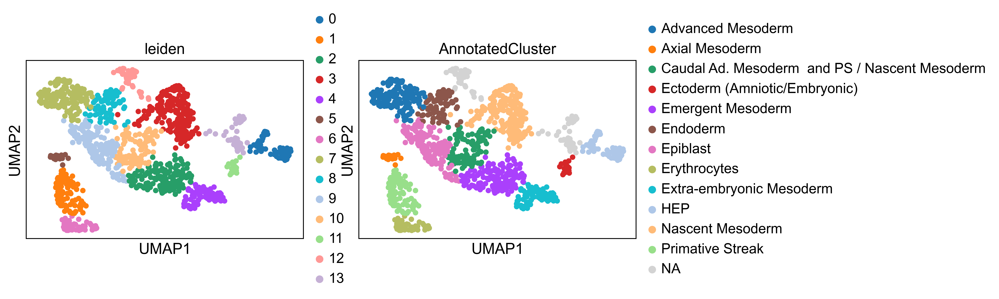

In [355]:
sc.tl.leiden(adata, resolution= 0.75, flavor="igraph", n_iterations=2)

fig, axs = plt.subplots(1, 2, figsize=(10,3), dpi=220)
sc.pl.umap(adata, color="leiden", ax=axs[0], show=False)
sc.pl.umap(adata, color="AnnotatedCluster", ax=axs[1], show=False)
plt.show()

#### __Fig. 1c__ from reference paper for comparison.

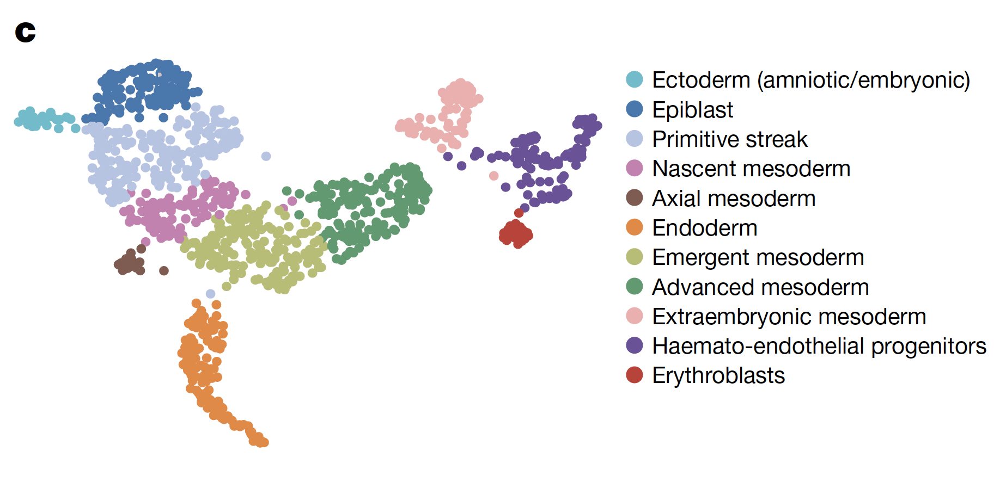

In [387]:
display(Image(filename='Fig1c.png', width=700, height=300))

### Optional step: h5ad to seurat

#### If wanted save a version of the AnnData object
`adata.write("adata_obj.h5ad")`

## Chapter 4: InferCNV for copy number variations analysis

### Create metadata file

In [62]:
#add metadata
adata.obs.to_csv("metadata.csv")

In [63]:
%%R
# read the metadata in R
metadata <- read_csv("metadata.csv")
metadata

Rows: 1195 Columns: 52
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (41): Source Name, Comment[ENA_SAMPLE], Comment[BioSD_SAMPLE], Character...
dbl (11): Comment[NOMINAL_LENGTH], Comment[NOMINAL_SDEV], n_genes_by_counts,...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
# A tibble: 1,195 × 52
   `Source Name` `Comment[ENA_SAMPLE]` `Comment[BioSD_SAMPLE]`
   <chr>         <chr>                 <chr>                  
 1 SS.sc7785278  ERS5181934            SAMEA7423586           
 2 SS.sc7785279  ERS5181935            SAMEA7423587           
 3 SS.sc7785280  ERS5181936            SAMEA7423588           
 4 SS.sc7785281  ERS5181937            SAMEA7423589           
 5 SS.sc7785282  ERS5181938            SAMEA7423590           
 6 SS.sc7785283  ERS5181939            SAMEA7423591           
 7 SS.sc7785286  ERS5181940            

### Create raw_counts.tsv 

#### Seurat handel the counts when the genes represented as rownames.

In [64]:
#We have to transpose the matrix.
raw_reads_indexed_transposed = raw_reads_indexed.T

#### Create raw_counts and cell cell-type annotation file for inferCNV

In [65]:
annotation_file = adata.obs[['AnnotatedCluster']].copy()
#annotation_file

In [66]:
#Save raw_counts as raw_counts.tsv 
raw_reads_indexed_transposed.to_csv("raw_counts.tsv", sep="\t")
#Save cell cell-type annotation file as cell_annotations.tsv
annotation_file.to_csv("cell_annotations.tsv", sep="\t", header=False)
#raw_reads_indexed_transposed

### Re-upload the data in __R__ as tsv files

In [67]:
%%R
raw_counts <- read.table("raw_counts.tsv", sep="\t", header=TRUE, row.names=1, check.names=FALSE)
head(rownames(raw_counts))

[1] "A1BG"     "A1BG.AS1" "A1CF"     "A2M"      "A2M.AS1"  "A2ML1"   


In [68]:
%%R
annotation_file <- read_tsv("cell_annotations.tsv")
annotation_file

Rows: 1194 Columns: 2
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): SS.sc7785278, HEP

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
# A tibble: 1,194 × 2
   SS.sc7785278 HEP                     
   <chr>        <chr>                   
 1 SS.sc7785279 Primative Streak        
 2 SS.sc7785280 Nascent Mesoderm        
 3 SS.sc7785281 Extra-embryonic Mesoderm
 4 SS.sc7785282 Axial Mesoderm          
 5 SS.sc7785283 Emergent Mesoderm       
 6 SS.sc7785286 HEP                     
 7 SS.sc7785288 Nascent Mesoderm        
 8 SS.sc7785289 Primative Streak        
 9 SS.sc7785290 Extra-embryonic Mesoderm
10 SS.sc7785291 Axial Mesoderm          
# ℹ 1,184 more rows
# ℹ Use `print(n = ...)` to see more rows


### For gene position data file required for `inferCNV` the authors have provided the file in this [link](https://github.com/broadinstitute/inferCNV_examples/tree/master/__gene_position_data), you can download it, if it is not present in your current directory.

In [405]:
%%R
#Gene order file found online
gene_order <- read_tsv("gencode_v19_gene_pos.txt")
gene_order

Rows: 55764 Columns: 4
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): DDX11L1, chr1
dbl (2): 11869, 14412

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
# A tibble: 55,764 × 4
   DDX11L1      chr1  `11869` `14412`
   <chr>        <chr>   <dbl>   <dbl>
 1 WASH7P       chr1    14363   29806
 2 MIR1302-11   chr1    29554   31109
 3 FAM138A      chr1    34554   36081
 4 OR4G4P       chr1    52473   54936
 5 OR4G11P      chr1    62948   63887
 6 OR4F5        chr1    69091   70008
 7 RP11-34P13.7 chr1    89295  133566
 8 RP11-34P13.8 chr1    89551   91105
 9 CICP27       chr1   131025  134836
10 AL627309.1   chr1   134901  139379
# ℹ 55,754 more rows
# ℹ Use `print(n = ...)` to see more rows


In [406]:
%%R
#Add column names for the file
colnames(gene_order) <- c("gene","chr","start","end")

In [407]:
%%R
# How many overlap
length(intersect(rownames(raw_counts), gene_order$gene))

[1] 30222


In [408]:
%%R
# Optional: save clean version for inferCNV (no header, 4 cols)
write.table(gene_order, "gene_order.tsv",
            sep="\t", quote=FALSE, row.names=FALSE, col.names=FALSE)

In [410]:
%%R
#make sure the gene_order have same genes as in raw_counts to prevent errors
gene_order_updated <- subset(gene_order, gene %in% rownames(raw_counts))

gene_order_updated <- gene_order_updated[match(rownames(raw_counts), gene_order_updated$gene), ]

# Remove any rows with newly emergent NA values from the subsetting step
gene_order_updated <- na.omit(gene_order_updated)

dim(gene_order_updated)

[1] 30222     4


#### Refine the genes present, their intersection with raw_counts and their order.

In [411]:
%%R
# Keep only genes that exist in gene_order
common_genes <- intersect(rownames(raw_counts), gene_order_updated$gene)
# Subset expression matrix
raw_counts <- raw_counts[common_genes, ]
# Subset gene order and keep the same order as counts
gene_order_final <- gene_order_updated[match(rownames(raw_counts), gene_order_updated$gene), ]

In [412]:
%%R
# check
all(rownames(raw_counts) == gene_order_final$gene)

[1] TRUE


In [77]:
%%R
# Save a clean version for inferCNV (no header, 4 cols)
write.table(gene_order, "gene_order_final.tsv",
            sep="\t", quote=FALSE, row.names=FALSE, col.names=FALSE)

## InferCNV

In [80]:
%%R
infercnv_obj <- CreateInfercnvObject(raw_counts_matrix = as.matrix(raw_counts),
                                     annotations_file = "cell_annotations.tsv",
                                     gene_order_file = "gene_order_final.tsv",
                                     delim = "\t",
                                     ref_group_names = "Epiblast" )

INFO [2025-10-08 15:46:07] Parsing gene order file: gene_order_final.tsv
INFO [2025-10-08 15:46:07] Parsing cell annotations file: cell_annotations.tsv
INFO [2025-10-08 15:46:07] ::order_reduce:Start.
INFO [2025-10-08 15:46:07] .order_reduce(): expr and order match.
INFO [2025-10-08 15:46:07] ::process_data:order_reduce:Reduction from positional data, new dimensions (r,c) = 30222,1195 Total=-174820.018278072 Min=-10 Max=10.
INFO [2025-10-08 15:46:07] num genes removed taking into account provided gene ordering list: 1657 = 5.4827609026537% removed.
INFO [2025-10-08 15:46:07] -filtering out cells < 100 or > Inf, removing 51.8828 % of cells
WARN [2025-10-08 15:46:07] Please use "options(scipen = 100)" before running infercnv if you are using the analysis_mode="subclusters" option or you may encounter an error while the hclust is being generated.
INFO [2025-10-08 15:46:09] validating infercnv_obj


In [81]:
%%R
infercnv_obj_run <- infercnv::run(
    infercnv_obj,
    out_dir = "output_dir",
    cutoff = 0,          # instead of 1, keeps more genes
    min_cells_per_gene = 5, # relax cell filter
    HMM = T,
    per_chr_hmm_subclusters=TRUE,
    HMM_type="i3",
    analysis_mode="subclusters", #inferCNV will attempt to find subpopulations with distinct CNV patterns, rather than assuming each provided group is uniform
    denoise = T)

INFO [2025-10-08 15:46:12] ::process_data:Start
INFO [2025-10-08 15:46:12] Creating output path output_dir
INFO [2025-10-08 15:46:12] Checking for saved results.
INFO [2025-10-08 15:46:12] 

	STEP 1: incoming data

INFO [2025-10-08 15:46:19] 

	STEP 02: Removing lowly expressed genes

INFO [2025-10-08 15:46:19] ::above_min_mean_expr_cutoff:Start
INFO [2025-10-08 15:46:19] Removing 6708 genes from matrix as below mean expr threshold: 0
INFO [2025-10-08 15:46:19] validating infercnv_obj
INFO [2025-10-08 15:46:19] There are 21857 genes and 575 cells remaining in the expr matrix.
INFO [2025-10-08 15:46:20] Removed 7850 genes having fewer than 5 min cells per gene = 35.9153 % genes removed here
INFO [2025-10-08 15:46:20] validating infercnv_obj
INFO [2025-10-08 15:46:24] 

	STEP 03: normalization by sequencing depth

INFO [2025-10-08 15:46:24] normalizing counts matrix by depth
INFO [2025-10-08 15:46:24] Computed total sum normalization factor as median libsize: 1565.062421
INFO [2025-10-08

Finding variable features for layer counts
Calculating gene variances
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
Calculating feature variances of standardized and clipped values
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
Centering and scaling data matrix
  |======================================================================| 100%
PC_ 1 
Positive:  CRELD2, ALG12, FTLP3, SMOX, PRNP, SLC1A6, OR7C1, RASSF2, ZNF333, SLC23A2 
	   NDUFB7, TECR, TMEM230, DNAJB1, GIPC1, PCNA, PTGER1, CDS2, ATPAF2, LINC00654 
	   PKN1, TOM1L2, GPCPD1, DDX39A, CHGB, TRMT6, SREBF1, MCM8, ASF1B, CRLS1 
Negative:  IL6ST, ITGA2, NNT, SPRTN, ARV1, PTK2B, BNIP3L, SDAD1P1, AC022431.1, MIR5687 
	   GPX8, ARL15, PELO, ITGA1, ISL1, RBMS1, PLA2R1, LY75, CD302, BAZ2B 
	   KCNK1, NTPCR, GNPAT, E

In [82]:
%%R
 plot_cnv(
       infercnv_obj_run,
       out_dir = "output_dir",
       output_filename = "infercnv_plott",
       png_res = 300)

INFO [2025-10-08 15:50:42] ::plot_cnv:Start
INFO [2025-10-08 15:50:42] ::plot_cnv:Current data dimensions (r,c)=14007,575 Total=8060977.94547191 Min=0.827673338207976 Max=1.15777732284435.
INFO [2025-10-08 15:50:43] ::plot_cnv:Depending on the size of the matrix this may take a moment.
INFO [2025-10-08 15:50:43] plot_cnv(): auto thresholding at: (0.968317 , 1.033409)
INFO [2025-10-08 15:50:43] plot_cnv_observation:Start
INFO [2025-10-08 15:50:43] Observation data size: Cells= 498 Genes= 14007
INFO [2025-10-08 15:50:43] plot_cnv_observation:Writing observation groupings/color.
INFO [2025-10-08 15:50:43] plot_cnv_observation:Done writing observation groupings/color.
INFO [2025-10-08 15:50:43] plot_cnv_observation:Writing observation heatmap thresholds.
INFO [2025-10-08 15:50:43] plot_cnv_observation:Done writing observation heatmap thresholds.
INFO [2025-10-08 15:50:44] Colors for breaks:  #00008B,#24249B,#4848AB,#6D6DBC,#9191CC,#B6B6DD,#DADAEE,#FFFFFF,#EEDADA,#DDB6B6,#CC9191,#BC6D6D,#AB

## Chapter 5: Integration 
### - Since ´infercnv´ was not able to create a full map of CNVs from this data. In this section, I have performed a single cell data integration of __Tyser's et al. (2021)__ data together with __Petropolus et. al (2016)__ data from this [study](https://doi.org/10.1016/j.cell.2016.03.023), the data were obtained from this site [Petropoulos & Lanner Labs](https://petropoulos-lanner-labs.clintec.ki.se/dataset.download.html). This site contains data derived from more than 30 papers, refined for integration, including the two studies we're targeting.

#### If you maintained the working directory and downloaded the counts and metadata files for both studies you can run the following lines!

In [13]:
#Metadata
metadata_tyser = pd.read_table("Tyser_2021_PMID_34789876.meta.tsv", index_col= "cell")
metadata_petro = pd.read_table("Petropoulos_2016_PMID_27062923.meta.tsv", index_col= "cell")
#counts
counts_tyser = pd.read_csv("Tyser_2021_PMID_34789876.counts.gz", index_col= "Gene")
counts_petro = pd.read_csv("Petropoulos_2016_PMID_27062923.counts.gz", index_col= "Gene")

In [14]:
# Transponse the counts to fit AnnData structure
counts_tyser = counts_tyser.T
counts_petro = counts_petro.T

In [15]:
# Build AnnData objects
adata_petro = ad.AnnData(
    X=counts_petro.values,                 # expression matrix
    obs=metadata_petro,                  # cell metadata
    var=pd.DataFrame(index=counts_petro.columns)  # gene metadata
)

adata_tyser = ad.AnnData(
    X=counts_tyser.values,                 # expression matrix
    obs=metadata_tyser,                  # cell metadata
    var=pd.DataFrame(index=counts_tyser.columns)  # gene metadata
)

In [16]:
adata_petro.var_names_make_unique()
sc.pp.calculate_qc_metrics(adata_petro, inplace=True)
sc.pp.normalize_total(adata_petro)
sc.pp.log1p(adata_petro)
sc.pp.scale(adata_petro, max_value=10)
sc.tl.pca(adata_petro, n_comps=30, random_state=42)
sc.pp.neighbors(adata_petro, n_neighbors=20, n_pcs=30, random_state=42)
sc.tl.umap(adata_petro, random_state=42)

normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=30
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:04)


In [17]:
adata_tyser.var_names_make_unique()
sc.pp.calculate_qc_metrics(adata_tyser, inplace=True)
sc.pp.normalize_total(adata_tyser)
sc.pp.log1p(adata_tyser)
sc.pp.scale(adata_tyser, max_value=10)
sc.tl.pca(adata_tyser, n_comps=30,random_state=42)
sc.pp.neighbors(adata_tyser, n_neighbors=20, n_pcs=30,random_state=42)
sc.tl.umap(adata_tyser,random_state=42)

normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=30
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:04)


In [18]:
sc.pp.highly_variable_genes(adata_petro)
sc.pp.highly_variable_genes(adata_tyser)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [19]:
sc.tl.leiden(adata_petro, resolution= 0.75, flavor="igraph", n_iterations=2,random_state=42)
sc.tl.leiden(adata_tyser, resolution= 0.75, flavor="igraph", n_iterations=2,random_state=42)

running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


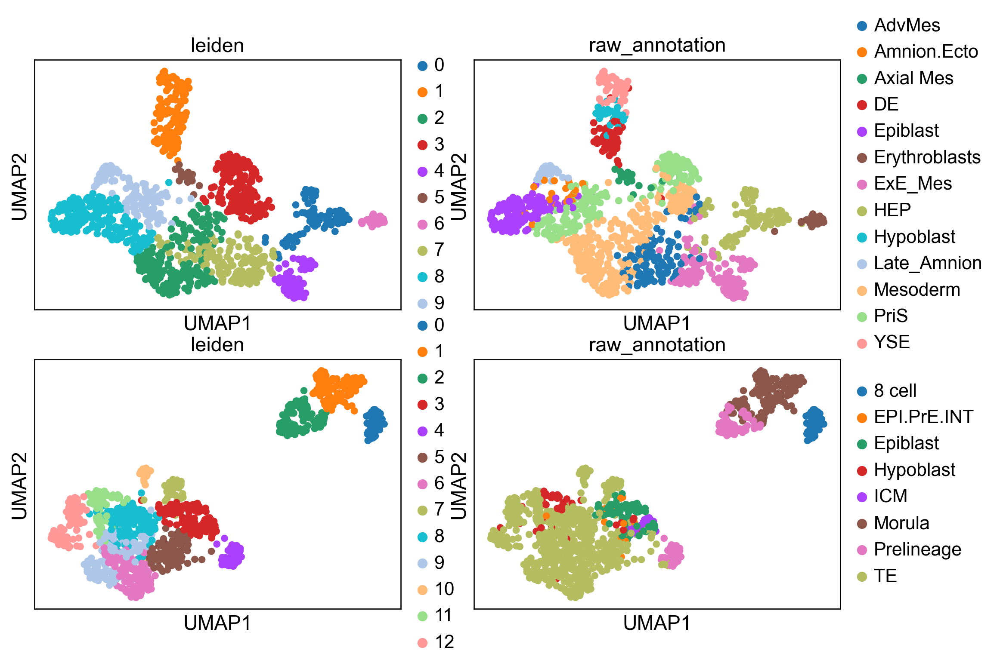

In [20]:
fig, axs = plt.subplots(2, 2, figsize=(10,7), dpi=120)
sc.pl.umap(adata_tyser, color="leiden", ax=axs[0,0], show=False)
sc.pl.umap(adata_tyser, color="raw_annotation", ax=axs[0,1], show=False)
sc.pl.umap(adata_petro, color="leiden", ax=axs[1,0], show=False)
sc.pl.umap(adata_petro, color="raw_annotation", ax=axs[1,1], show=False)
plt.show()

#### Maintain shared genes between two objects before integration

In [21]:
shared_genes = adata_tyser.var_names.intersection(adata_petro.var_names)
adata_tyser = adata_tyser[:, shared_genes]
adata_petro = adata_petro[:, shared_genes]

In [22]:
print(f"Shared genes: {len(shared_genes)}")

Shared genes: 33501


#### Merge objects

In [23]:
adatas_merged = ad.concat([adata_tyser, adata_petro], merge="same")
#adatas_merged.obs #2363 rows × 17 columns

#### Apply independent normalization and scaling

In [24]:
adatas_merged.var_names_make_unique()
sc.pp.calculate_qc_metrics(adatas_merged, inplace=True)
sc.pp.scale(adatas_merged, max_value=10)
sc.tl.pca(adatas_merged, n_comps=30, random_state=42)
sc.pp.neighbors(adatas_merged, n_neighbors= 50, n_pcs=30, random_state=42)
sc.tl.umap(adatas_merged, random_state=42)

sc.pp.highly_variable_genes(adatas_merged)
sc.tl.leiden(adatas_merged, resolution= 0.75, random_state=42)

/Users/mohammedkhattab/Desktop/venv/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/mohammedkhattab/Desktop/venv/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


computing PCA
    with n_comps=30
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:22)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
running Leiden clustering


/var/folders/sm/v_yn0d7j7xl1n8zc_c47_tgc0000gn/T/ipykernel_8442/573973735.py:9: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adatas_merged, resolution= 0.75, random_state=42)


    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


### Unintegrated

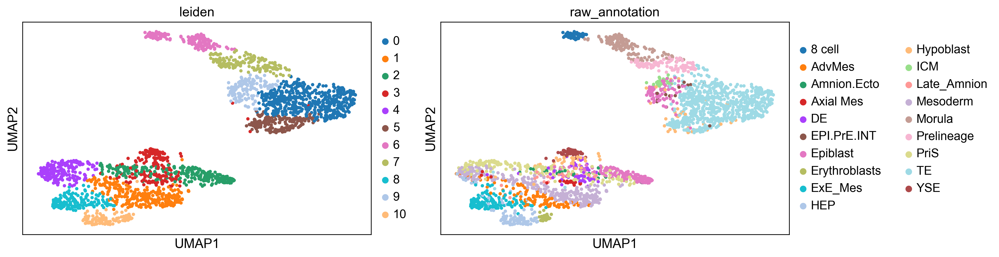

In [25]:
fig, axs = plt.subplots(1, 2, figsize=(15, 4), dpi=120)

# Example: one UMAP by dataset, one by raw annotation
sc.pl.umap(adatas_merged, color="leiden", ax=axs[0], show=False)
sc.pl.umap(adatas_merged, color="raw_annotation", ax=axs[1], show=False)

plt.tight_layout()
plt.show()

### Run Scanorama correction

In [26]:
adatas = [adata_tyser, adata_petro]

corrected_mats, genes = scanorama.correct(
    [ad.X for ad in adatas],
    [ad.var_names for ad in adatas],
    return_dimred=False
)

# Convert gene list to Index
shared_genes = pd.Index(genes)

# Subset both to the same genes and replace expression
for i in range(len(adatas)):
    adatas[i] = adatas[i][:, shared_genes]
    adatas[i].X = corrected_mats[i]

# Merge integrated AnnData
adata_integrated = adatas[0].concatenate(
    adatas[1],
    batch_key="dataset",
    batch_categories=["Tyser", "Petropoulos"],
    index_unique=None
)

print(adata_integrated)

Found 33501 genes among all datasets
[[0.   0.41]
 [0.   0.  ]]
Processing datasets (0, 1)


/var/folders/sm/v_yn0d7j7xl1n8zc_c47_tgc0000gn/T/ipykernel_8442/1314771505.py:15: UserWarning: Trying to set a dense array with a sparse array on a view.Densifying the sparse array.This may incur excessive memory usage
  adatas[i].X = corrected_mats[i]
/var/folders/sm/v_yn0d7j7xl1n8zc_c47_tgc0000gn/T/ipykernel_8442/1314771505.py:15: ImplicitModificationWarning: Modifying `X` on a view results in data being overridden
  adatas[i].X = corrected_mats[i]
/var/folders/sm/v_yn0d7j7xl1n8zc_c47_tgc0000gn/T/ipykernel_8442/1314771505.py:18: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_integrated = adatas[0].concatenate(


AnnData object with n_obs × n_vars = 2363 × 33501
    obs: 'devTime', 'raw_annotation', 'pred_annotation', 'sub_pred_annotation', 'prediction_score_max', 'pred_psdt', 'proj_UMAP_1', 'proj_UMAP_2', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'leiden', 'dataset'
    var: 'n_cells_by_counts-Petropoulos', 'mean_counts-Petropoulos', 'log1p_mean_counts-Petropoulos', 'pct_dropout_by_counts-Petropoulos', 'total_counts-Petropoulos', 'log1p_total_counts-Petropoulos', 'mean-Petropoulos', 'std-Petropoulos', 'highly_variable-Petropoulos', 'means-Petropoulos', 'dispersions-Petropoulos', 'dispersions_norm-Petropoulos', 'n_cells_by_counts-Tyser', 'mean_counts-Tyser', 'log1p_mean_counts-Tyser', 'pct_dropout_by_counts-Tyser', 'total_counts-Tyser', 'log1p_total_counts-Tyser', 'mean-Tyser', 'std-Tyser', 'highly_variable-Tyser', 'means-Tyser', 

In [35]:
adata_integrated.shape  # should show (n_cells_total, ~shared_genes)
adata_integrated.obs["dataset"].value_counts()

dataset
Petropoulos    1193
Tyser          1170
Name: count, dtype: int64

In [36]:
sc.pp.scale(adata_integrated, max_value=10)
sc.tl.pca(adata_integrated, n_comps=30, random_state=42)
sc.pp.neighbors(adata_integrated, n_neighbors= 50, n_pcs=30, random_state=42)
sc.tl.umap(adata_integrated, random_state=42)

computing PCA
    with n_comps=30
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:22)


### Integrated UMAP

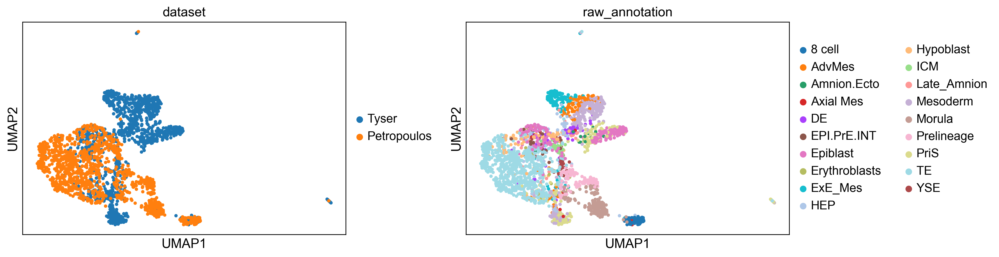

In [37]:
fig, axs = plt.subplots(1, 2, figsize=(15, 4), dpi=120)

# Example: one UMAP by dataset, one by raw annotation
sc.pl.umap(adata_integrated, color="dataset", ax=axs[0], show=False)
sc.pl.umap(adata_integrated, color="raw_annotation", ax=axs[1], show=False)

plt.tight_layout()
plt.show()

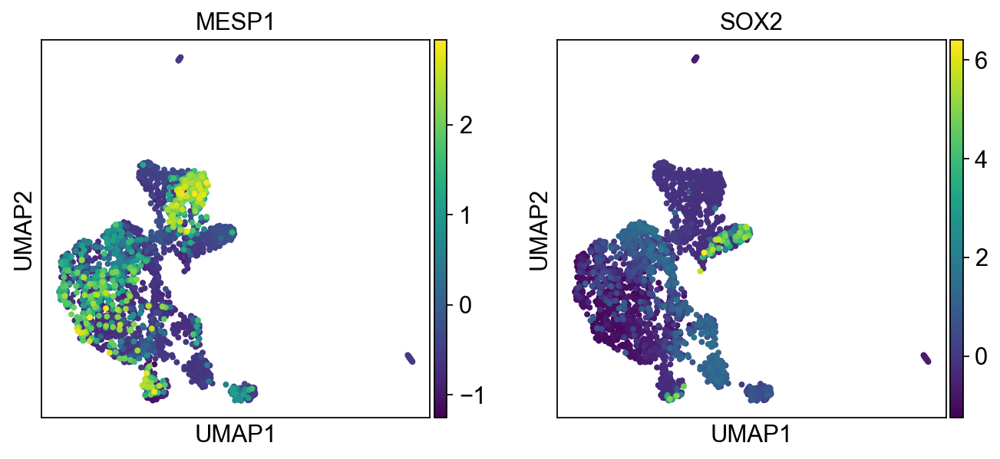

In [40]:
sc.pl.umap(adata_integrated, color=["MESP1", "SOX2"], ncols=2)

#### Prepare files for inferCNV

#### If wanted save a version of the Integrated AnnData object
`adata_integrated.write("adata_obj_Integrated.h5ad")`

In [42]:
#add metadata
adata_integrated.obs.to_csv("metadata_integrated.csv")

In [104]:
%%R
metadata_integrated <- read_csv("metadata_integrated.csv")

Rows: 2363 Columns: 19
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (6): cell, devTime, raw_annotation, pred_annotation, sub_pred_annotatio...
dbl (13): prediction_score_max, pred_psdt, proj_UMAP_1, proj_UMAP_2, n_genes...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
# A tibble: 2,363 × 19
   cell      devTime raw_annotation pred_annotation sub_pred_annotation
   <chr>     <chr>   <chr>          <chr>           <chr>              
 1 sc7785290 CS7     HEP            HEP             HEP                
 2 sc7786612 CS7     DE             Ambiguous       Ambiguous          
 3 sc7786605 CS7     AdvMes         AdvMes          AdvMes             
 4 sc7785737 CS7     PriS           Ambiguous       Ambiguous          
 5 sc7785398 CS7     ExE_Mes        ExE_Mes         ExE_Mes            
 6 sc7788091 CS7     Axial Mes      Axi

In [105]:
annotated_cluster_integrated = adata_integrated.obs[['raw_annotation']].copy()

,raw_annotation
cell,
sc7785290,HEP
sc7786612,DE
sc7786605,AdvMes
sc7785737,PriS
sc7785398,ExE_Mes
...,...
E7.9.564,TE
E7.9.567,TE
E7.9.568,TE


In [106]:
annotated_cluster_integrated.to_csv("cell_annotations_integrated.tsv", sep="\t", header=False)

In [43]:
merged_counts = pd.concat([counts_petro, counts_tyser], axis=0)
merged_counts #2363 rows × 33501 columns

Gene,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.4,AL732372.1,OR4F29,AC114498.1,...,AC007325.2,BX072566.1,AL354822.1,AC023491.2,AC004556.1,AC233755.2,AC233755.1,AC240274.1,AC213203.1,FAM231C
E3.1.443,0,0,0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,3,9,0,0
E3.1.444,0,0,0,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,6,0,0
E3.1.445,0,0,0,18,4,0,0,0,0,0,...,0,0,0,0,0,0,0,2,0,0
E3.1.447,0,0,0,9,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
E3.1.448,0,0,0,10,0,0,0,0,0,0,...,0,0,2,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
sc7785965,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
sc7788259,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
sc7786123,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
sc7786212,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [109]:
merged_counts.T.to_csv("raw_counts_integrated.tsv", sep="\t")

In [110]:
%%R
raw_counts_int <- read.table("raw_counts_integrated.tsv", sep="\t", header=TRUE, row.names=1, check.names=FALSE)
head(rownames(raw_counts_int))

[1] "MIR1302-2HG" "FAM138A"     "OR4F5"       "AL627309.1"  "AL627309.3" 
[6] "AL627309.2" 


In [111]:
%%R
annotation_file <- read_tsv("cell_annotations_integrated.tsv")
annotation_file

Rows: 2362 Columns: 2
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): sc7785290, HEP

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
# A tibble: 2,362 × 2
   sc7785290 HEP          
   <chr>     <chr>        
 1 sc7786612 DE           
 2 sc7786605 AdvMes       
 3 sc7785737 PriS         
 4 sc7785398 ExE_Mes      
 5 sc7788091 Axial Mes    
 6 sc7785785 Erythroblasts
 7 sc7785959 ExE_Mes      
 8 sc7785611 YSE          
 9 sc7786585 Mesoderm     
10 sc7785580 ExE_Mes      
# ℹ 2,352 more rows
# ℹ Use `print(n = ...)` to see more rows


In [ ]:
%%R
#Gene order file found online as mentioned above
gene_order <- read_tsv("gencode_v19_gene_pos.txt")
gene_order

In [113]:
%%R
colnames(gene_order) <- c("gene","chr","start","end")
# Optional: save clean version for inferCNV (no header, 4 cols)
write.table(gene_order, "gene_order_integrated.tsv",
            sep="\t", quote=FALSE, row.names=FALSE, col.names=FALSE)

In [114]:
%%R
#make sure the gene_order have same genes as in raw_counts to prevent errors
gene_order_updated <- subset(gene_order, gene %in% rownames(raw_counts))
gene_order_updated <- gene_order_updated[match(rownames(raw_counts), gene_order_updated$gene), ]
head(gene_order_updated)

# A tibble: 6 × 4
  gene    chr      start      end
  <chr>   <chr>    <dbl>    <dbl>
1 A1BG    chr19 58856544 58864865
2 A1CF    chr10 52559169 52645435
3 A2M     chr12  9220260  9268825
4 A2ML1   chr12  8975068  9039597
5 A2MP1   chr12  9381129  9428413
6 A3GALT2 chr1  33772367 33786699


In [115]:
%%R
# Remove any rows with NA values
gene_order_updated <- na.omit(gene_order_updated)
head(gene_order_updated)

# A tibble: 6 × 4
  gene    chr      start      end
  <chr>   <chr>    <dbl>    <dbl>
1 A1BG    chr19 58856544 58864865
2 A1CF    chr10 52559169 52645435
3 A2M     chr12  9220260  9268825
4 A2ML1   chr12  8975068  9039597
5 A2MP1   chr12  9381129  9428413
6 A3GALT2 chr1  33772367 33786699


In [116]:
%%R
# Keep only genes that exist in gene_order
common_genes <- intersect(rownames(raw_counts), gene_order_updated$gene)
# Subset expression matrix
raw_counts <- raw_counts[common_genes, ]
gene_order_final <- gene_order_updated[match(rownames(raw_counts), gene_order_updated$gene), ]
# Sanity check
all(rownames(raw_counts) == gene_order_final$gene)

[1] TRUE


In [117]:
%%R
# Optional: save clean version for inferCNV (no header, 4 cols)
write.table(gene_order, "gene_order_integrated_final.tsv",
            sep="\t", quote=FALSE, row.names=FALSE, col.names=FALSE)

### InferCNV for integrated dataset

In [119]:
%%R
infercnv_obj <- CreateInfercnvObject(raw_counts_matrix = as.matrix(raw_counts_int),
                                     annotations_file = "cell_annotations_integrated.tsv",
                                     gene_order_file = "gene_order_integrated_final.tsv",
                                     delim = "\t",
                                     ref_group_names = "Epiblast" )

INFO [2025-10-08 16:10:40] Parsing gene order file: gene_order_integrated_final.tsv
INFO [2025-10-08 16:10:40] Parsing cell annotations file: cell_annotations_integrated.tsv
INFO [2025-10-08 16:10:40] ::order_reduce:Start.
INFO [2025-10-08 16:10:40] .order_reduce(): expr and order match.
INFO [2025-10-08 16:10:40] ::process_data:order_reduce:Reduction from positional data, new dimensions (r,c) = 33501,2363 Total=4698023250 Min=0 Max=507967.
INFO [2025-10-08 16:10:40] num genes removed taking into account provided gene ordering list: 12754 = 38.070505358049% removed.
INFO [2025-10-08 16:10:40] -filtering out cells < 100 or > Inf, removing 0 % of cells
WARN [2025-10-08 16:10:41] Please use "options(scipen = 100)" before running infercnv if you are using the analysis_mode="subclusters" option or you may encounter an error while the hclust is being generated.
INFO [2025-10-08 16:10:42] validating infercnv_obj


In [120]:
%%R
infercnv_obj_run <- infercnv::run(
    infercnv_obj,
    out_dir = "output_dir_integrated",
    cutoff = 1,          # Works well with SmartSeq2
    min_cells_per_gene = 10, # relax cell filter
    HMM = T,
    analysis_mode="subclusters", #inferCNV will attempt to find subpopulations with distinct CNV patterns, rather than assuming each provided group is uniform
    denoise = T)

INFO [2025-10-08 16:10:42] ::process_data:Start
INFO [2025-10-08 16:10:42] Creating output path output_dir_integrated
INFO [2025-10-08 16:10:42] Checking for saved results.
INFO [2025-10-08 16:10:42] 

	STEP 1: incoming data

INFO [2025-10-08 16:11:00] 

	STEP 02: Removing lowly expressed genes

INFO [2025-10-08 16:11:00] ::above_min_mean_expr_cutoff:Start
INFO [2025-10-08 16:11:00] Removing 6993 genes from matrix as below mean expr threshold: 1
INFO [2025-10-08 16:11:00] validating infercnv_obj
INFO [2025-10-08 16:11:00] There are 13754 genes and 2363 cells remaining in the expr matrix.
INFO [2025-10-08 16:11:01] no genes removed due to min cells/gene filter
INFO [2025-10-08 16:11:18] 

	STEP 03: normalization by sequencing depth

INFO [2025-10-08 16:11:18] normalizing counts matrix by depth
INFO [2025-10-08 16:11:19] Computed total sum normalization factor as median libsize: 473728.000000
INFO [2025-10-08 16:11:19] Adding h-spike
INFO [2025-10-08 16:11:19] -hspike modeling of Epiblas

Finding variable features for layer counts
Calculating gene variances
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
Calculating feature variances of standardized and clipped values
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
Centering and scaling data matrix
  |======================================================================| 100%
PC_ 1 
Positive:  CAPN10, RNPEPL1, KIF1A, DUSP28, ANKMY1, PASK, GPC1, NDUFA10, PPP1R7, HDAC4 
	   ANO7, ASB1, TRAF3IP1, KIAA0930, FAM118A, SMC1B, NUP50, RIBC2, PER2, FBLN1 
	   HDLBP, ATXN10, PHF21B, WNT7B, PPARA, ARHGAP8, CDPF1, TTC38, HES6, GTSE1 
Negative:  ZNF610, ZNF480, ZNF766, PPP2R1A, ZNF836, GABBR1, ZNF616, MOG, ZNF841, ZNF432 
	   ZFP57, ZNF614, HLA-F, ZNF615, ZSCAN4, ZNF551, ZNF154, ZNF211, HLA-G, ZNF134 
	   ZNF350, Z

### You can check you working directory for the output folders generated by inferCNV.

## Thank you!